In [ ]:
import os
import shutil
from sklearn.model_selection import train_test_split # To split the data into train and test
import cv2
import random
from concurrent.futures import ThreadPoolExecutor
from PIL import Image, ImageDraw
import matplotlib.pyplot as plt
import numpy as np
import glob

In [ ]:
# Define base path for the dataset
base_data_dir = os.path.join("riped and unriped tomato dataset")
print(f"Base Data Directory: {base_data_dir}")

Base Data Directory: riped and unriped tomato dataset


In [ ]:
# Define specific paths for images and labels
images_dir = os.path.join(base_data_dir, "images")
labels_dir = os.path.join(base_data_dir, "labels")

print(f"Images Dir: {images_dir}, Labels Dir: {labels_dir}")

Images Dir: riped and unriped tomato dataset/images, Labels Dir: riped and unriped tomato dataset/labels


In [ ]:
# Get a list of all files in the directory
files = glob.glob(os.path.join(images_dir, '*'))

# Collect unique file extensions
extensions = set()
for file in files:
    _, ext = os.path.splitext(file)
    extensions.add(ext.lower())  # Convert to lowercase to handle case sensitivity

# Print all unique extensions found
print("Unique File Extensions:")
for ext in extensions:
    print(ext)

Unique File Extensions:
.jpeg


#A função abaixo carrega imagens e os caminhos correspondentes das anotações a partir dos diretórios.

In [ ]:
def load_data(images_dir, labels_dir):
    images = []
    annotations = []

    for filename in os.listdir(images_dir):
        if filename.endswith('.jpeg'):
            image_path = os.path.join(images_dir, filename)
            annotation_path = os.path.join(labels_dir, filename.replace('.jpeg', '.txt'))

            if os.path.exists(annotation_path):
                images.append(image_path)
                annotations.append(annotation_path)

    return images, annotations

In [ ]:
images, annotations = load_data(images_dir, labels_dir)

#Para visualizar uma amostra aleatória de imagens, vamos criar uma função chamada visualize_samples

In [ ]:
def visualize_samples(images, num_samples=5):
    fig, axs = plt.subplots(1, num_samples, figsize=(15, 5))

    for i in range(num_samples):
        image = Image.open(images[i])
        axs[i].imshow(image)
        axs[i].axis('off')
        axs[i].set_title(f'Sample {i+1}')

    plt.show()

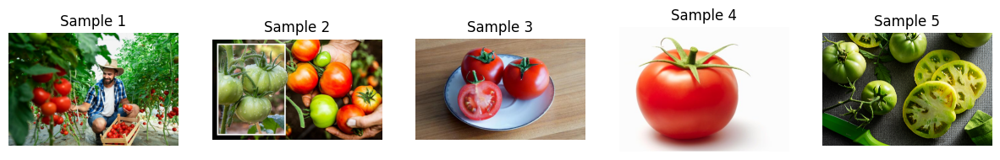

In [ ]:
visualize_samples(images)

#Vamos calcular e visualizar a altura e a largura médias das imagens no conjunto de dados.

In [ ]:
def calculate_average_size(images_dir):
    total_width = 0
    total_height = 0
    total_images = 0

    for filename in os.listdir(images_dir):
        if filename.endswith('.jpeg'):  # assuming images are in .jpeg format
            image_path = os.path.join(images_dir, filename)
            image = Image.open(image_path)
            width, height = image.size
            total_width += width
            total_height += height
            total_images += 1

    if total_images > 0:
        average_width = total_width / total_images
        average_height = total_height / total_images
        return average_width, average_height
    else:
        return None

In [ ]:
def plot_average_size(average_width, average_height):
    categories = ['Average Width', 'Average Height']
    values = [average_width, average_height]

    plt.figure(figsize=(6, 4))
    plt.bar(categories, values, color=['skyblue', 'lightgreen'])
    plt.xlabel('Categories')
    plt.ylabel('Pixels')
    plt.title('Average Image Dimensions')
    plt.ylim(0, max(values) * 1.1)
    plt.grid(axis='y')
    plt.show()

Average Image Width: 1374.88 pixels
Average Image Height: 991.36 pixels


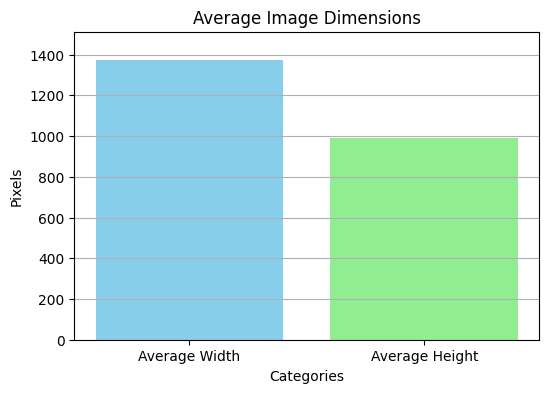

In [ ]:
average_width, average_height = calculate_average_size(images_dir)

if average_width and average_height:
    print(f"Average Image Width: {average_width:.2f} pixels")
    print(f"Average Image Height: {average_height:.2f} pixels")

    # Plot average size
    plot_average_size(average_width, average_height)
else:
    print("No images found or unable to calculate average size.")

#Também vamos plotar a distribuição das classes ('ripe' e 'unripe'), então vamos criar uma função separada para isso.

In [ ]:
def plot_class_distribution(annotations):
    classes = {'ripe': 0, 'unripe': 0}

    for annotation_file in annotations:
        with open(annotation_file, 'r') as f:
            lines = f.readlines()
            for line in lines:
                class_label = line.split()[0]  # assuming YOLO format with class label as first entry
                if class_label == '0':
                    classes['unripe'] += 1
                elif class_label == '1':
                    classes['ripe'] += 1
    # Print the class counts
    for cls, count in classes.items():
        print(f"{cls}: {count}")

    # Plotting
    plt.bar(classes.keys(), classes.values())
    plt.title('Class Distribution')
    plt.xlabel('Class')
    plt.ylabel('Count')
    plt.show()

ripe: 429
unripe: 440


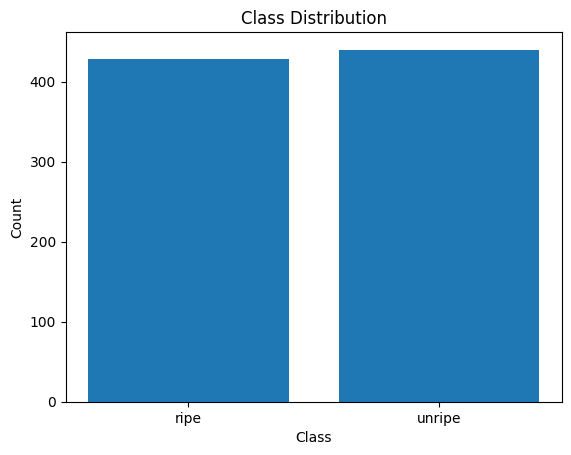

In [ ]:
plot_class_distribution(annotations)

#Vamos explorar as distribuições RGB dos nossos conjuntos de dados. Geralmente, os tomates maduros terão maior intensidade no canal vermelho, enquanto os tomates verdes (não maduros) podem apresentar maior intensidade no canal verde.

In [ ]:
from glob import glob

In [ ]:
def read_annotations(annotation_path):
    with open(annotation_path, 'r') as file:
        return file.read().strip()

In [ ]:
def read_image(img_path):
    img = cv2.imread(img_path)
    if img is not None:
        return img
    return np.array([])

In [ ]:
def process_images_in_batches(images, max_images=50, batch_size=10):
    """Process images in batches to reduce memory usage."""
    r_values, g_values, b_values = [], [], []

    # Limit the number of images to max_images
    images = images[:max_images]

    for i in range(0, len(images), batch_size):
        batch = images[i:i + batch_size]
        with ThreadPoolExecutor() as executor:
            img_list = list(executor.map(read_image, batch))

        for img in img_list:
            if img.size > 0:
                r_values.extend(img[:, :, 0].flatten())
                g_values.extend(img[:, :, 1].flatten())
                b_values.extend(img[:, :, 2].flatten())

    return r_values, g_values, b_values

def plot_rgb_distribution(images, category_name, max_images=50, batch_size=10):
    """Plot RGB distribution for the given images."""
    r_values, g_values, b_values = process_images_in_batches(images, max_images, batch_size)

    plt.figure(figsize=(15, 5))

    # Red Channel
    plt.subplot(1, 3, 1)
    r_hist, r_bins = np.histogram(r_values, bins=256, range=(0, 256))
    plt.bar(r_bins[:-1], r_hist, width=1, color='red', alpha=0.5)
    max_r_freq = r_hist.max()
    plt.axhline(max_r_freq, color='red', linestyle='--', label=f'Max Frequency: {max_r_freq}')
    plt.title(f'{category_name} - Red Channel')
    plt.xlabel('Pixel Value')
    plt.ylabel('Frequency')
    plt.legend()

    # Green Channel
    plt.subplot(1, 3, 2)
    g_hist, g_bins = np.histogram(g_values, bins=256, range=(0, 256))
    plt.bar(g_bins[:-1], g_hist, width=1, color='green', alpha=0.5)
    max_g_freq = g_hist.max()
    plt.axhline(max_g_freq, color='green', linestyle='--', label=f'Max Frequency: {max_g_freq}')
    plt.title(f'{category_name} - Green Channel')
    plt.xlabel('Pixel Value')
    plt.ylabel('Frequency')
    plt.legend()

    # Blue Channel
    plt.subplot(1, 3, 3)
    b_hist, b_bins = np.histogram(b_values, bins=256, range=(0, 256))
    plt.bar(b_bins[:-1], b_hist, width=1, color='blue', alpha=0.5)
    max_b_freq = b_hist.max()
    plt.axhline(max_b_freq, color='blue', linestyle='--', label=f'Max Frequency: {max_b_freq}')
    plt.title(f'{category_name} - Blue Channel')
    plt.xlabel('Pixel Value')
    plt.ylabel('Frequency')
    plt.legend()

    plt.tight_layout()
    plt.show()

In [ ]:
# Separate ripe and unripe tomatoes based on annotations
ripe_images = []
unripe_images = []

for img_path, annotation_path in zip(images, annotations):
    annotation = read_annotations(annotation_path)
    if annotation.startswith('1'):
        ripe_images.append(img_path)
    elif annotation.startswith('0'):
        unripe_images.append(img_path)

In [ ]:
# Debugging: Print the number of images in each category
print(f"Number of ripe images: {len(ripe_images)}")
print(f"Number of unripe images: {len(unripe_images)}")

Number of ripe images: 91
Number of unripe images: 86


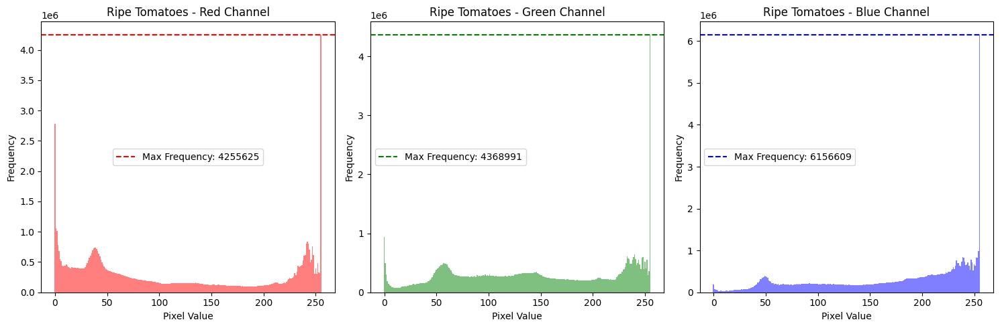

In [ ]:
# Plot RGB distribution for ripe tomatoes
plot_rgb_distribution(ripe_images, 'Ripe Tomatoes')

In [ ]:
# Plot RGB distribution for unripe tomatoes
plot_rgb_distribution(unripe_images, 'Unripe Tomatoes')

#nao foi possivel executar por nao suportar a RAM

#A partir da análise acima, podemos ver que a distribuição da cor vermelha (RED) é maior para os tomates maduros, enquanto a verde (Green) é mais intensa nos tomates verdes, indicando que os tomates maduros apresentam uma presença mais forte da cor vermelha em suas imagens, e os verdes, da cor verde.

Vamos aplicar diversas técnicas de detecção de bordas e observar qual delas captura melhor as características dos tomates.

Limiarização Adaptativa (Adaptive Thresholding): Realça o contraste para destacar as bordas.

Detecção Laplaciana (Laplacian Detection): Detecta mudanças rápidas de intensidade.

Detecção de Canny (Canny Detection): Identifica bordas detalhadas por meio da análise de gradientes.

Detecção de Sobel (Sobel Detection): Encontra bordas utilizando o gradiente nas direções x e y.

In [ ]:
def calculate_edge_density(edges):
    return np.sum(edges) / edges.size

In [ ]:
def display_random_images_with_edges(basefolder, num_images=5):
    # Define image folder path and get list of image files
    image_folder = basefolder
    image_files = glob(os.path.join(image_folder, "*.jpeg"))

    # Check if there are enough images to display
    if len(image_files) < num_images:
        print(f"Not enough images in {image_folder} to display {num_images}.")
        return

    # Randomly select images
    selected_images = random.sample(image_files, num_images)

    # Create subplots to display the images
    fig, axes = plt.subplots(num_images, 5, figsize=(20, 4 * num_images))

    for idx, image_file in enumerate(selected_images):
        # Read and preprocess the image
        img_path = img_path = image_file
        img = cv2.imread(img_path)
        img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

        # Apply various edge detection techniques
        # Adaptive Thresholding
        adaptive_thresh = cv2.adaptiveThreshold(gray_img, 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY, 11, 3)

        # Laplacian Edge Detection
        lap = cv2.Laplacian(gray_img, cv2.CV_64F)
        lap = np.uint8(np.absolute(lap))
        lap_rgb = cv2.cvtColor(lap, cv2.COLOR_GRAY2RGB)

        # Canny Edge Detection
        mean_intensity = np.mean(gray_img)
        std_intensity = np.std(gray_img)
        lower_threshold = int(max(0, mean_intensity - 2 * std_intensity))
        upper_threshold = int(min(255, mean_intensity + 2 * std_intensity))
        edges = cv2.Canny(gray_img, lower_threshold, upper_threshold)

        # Sobel Edge Detection
        sobelx = cv2.Sobel(gray_img, cv2.CV_64F, 1, 0)
        sobely = cv2.Sobel(gray_img, cv2.CV_64F, 0, 1)
        combined_sobel = cv2.bitwise_or(cv2.convertScaleAbs(sobelx), cv2.convertScaleAbs(sobely))
        combined_sobel_rgb = cv2.cvtColor(combined_sobel, cv2.COLOR_GRAY2RGB)

        # Display Original Image
        axes[idx, 0].imshow(img_rgb)
        axes[idx, 0].set_title('Original')
        axes[idx, 0].axis('off')

        # Display Adaptive Thresholded Image
        axes[idx, 1].imshow(adaptive_thresh, cmap='gray')
        axes[idx, 1].set_title('Adaptive Threshold')
        axes[idx, 1].axis('off')

        # Display Laplacian Edge Detection Image
        axes[idx, 2].imshow(lap_rgb)
        axes[idx, 2].set_title('Laplacian')
        axes[idx, 2].axis('off')

        # Display Canny Edge Detection Image
        axes[idx, 3].imshow(edges, cmap='gray')
        axes[idx, 3].set_title('Canny')
        axes[idx, 3].axis('off')

        # Display Sobel Edge Detection Image
        axes[idx, 4].imshow(combined_sobel_rgb)
        axes[idx, 4].set_title('Sobel')
        axes[idx, 4].axis('off')

    # Adjust layout and show plot
    plt.tight_layout()
    plt.show()

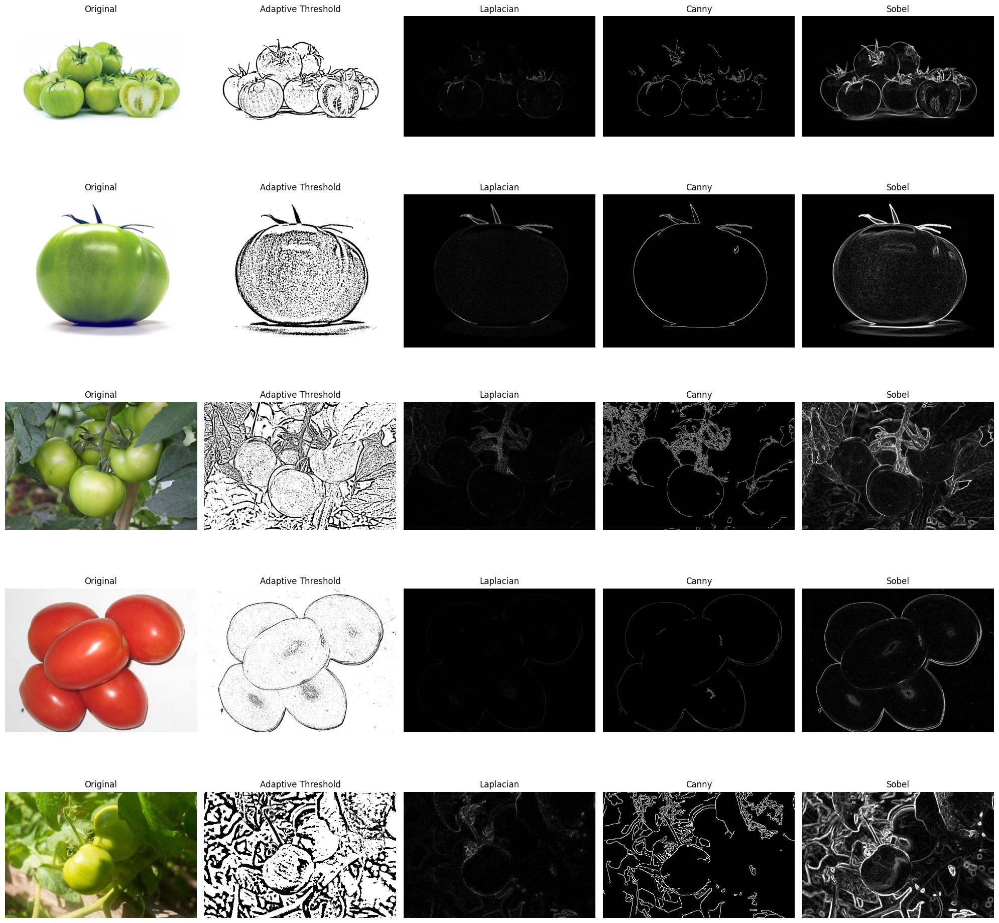

In [ ]:
display_random_images_with_edges(images_dir, num_images=5)

#Vamos comparar a densidade de bordas das técnicas de detecção de bordas acima. Para isso, vamos plotar a frequência versus a densidade de bordas das técnicas aplicadas.

In [ ]:
def display_edge_density(basefolder, num_images=5):
    image_files = glob(os.path.join(basefolder, "*.jpeg"))
    if len(image_files) < num_images:
        print(f"Not enough images in {basefolder} to display {num_images}.")
        return

    selected_images = random.sample(image_files, num_images)
    densities = {'Adaptive Threshold': [], 'Laplacian': [], 'Canny': [], 'Sobel': []}

    for img_file in selected_images:
        img_path = img_file
        img = cv2.imread(img_path)
        gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

        # Adaptive Thresholding
        adaptive_thresh = cv2.adaptiveThreshold(gray_img, 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY, 11, 3)
        densities['Adaptive Threshold'].append(calculate_edge_density(adaptive_thresh))

        # Laplacian Edge Detection
        lap = cv2.Laplacian(gray_img, cv2.CV_64F)
        lap = np.uint8(np.absolute(lap))
        densities['Laplacian'].append(calculate_edge_density(lap))

        # Canny Edge Detection
        mean_intensity = np.mean(gray_img)
        std_intensity = np.std(gray_img)
        lower_threshold = int(max(0, mean_intensity - 2 * std_intensity))
        upper_threshold = int(min(255, mean_intensity + 2 * std_intensity))
        edges = cv2.Canny(gray_img, lower_threshold, upper_threshold)
        densities['Canny'].append(calculate_edge_density(edges))

        # Sobel Edge Detection
        sobelx = cv2.Sobel(gray_img, cv2.CV_64F, 1, 0)
        sobely = cv2.Sobel(gray_img, cv2.CV_64F, 0, 1)
        combined_sobel = cv2.bitwise_or(cv2.convertScaleAbs(sobelx), cv2.convertScaleAbs(sobely))
        densities['Sobel'].append(calculate_edge_density(combined_sobel))

    # Plot the average edge densities for each method
    plt.figure(figsize=(12, 6))
    for method, density_values in densities.items():
        plt.hist(density_values, bins=10, alpha=0.5, label=method)

    plt.title('Edge Density Comparison')
    plt.xlabel('Edge Density')
    plt.ylabel('Frequency')
    plt.legend()
    plt.show()

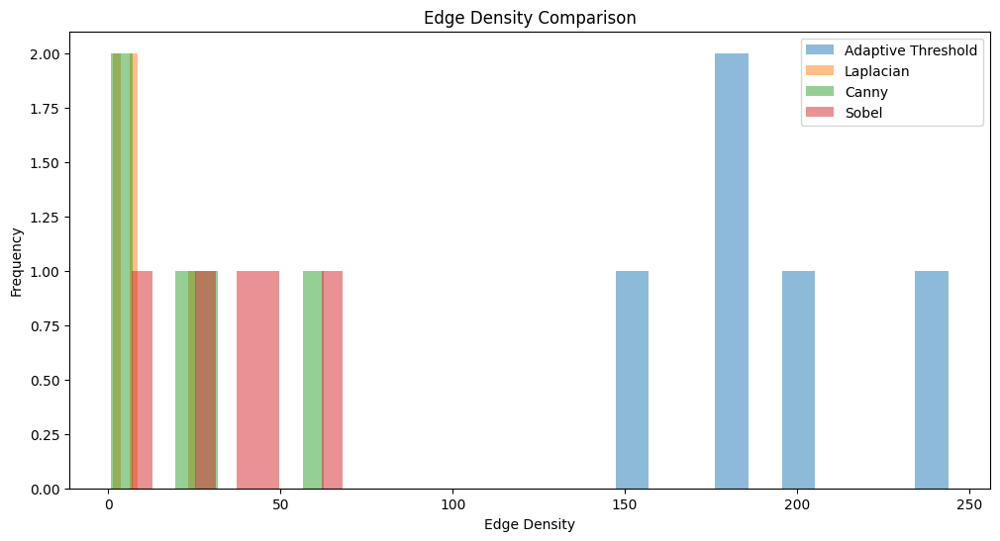

In [ ]:
display_edge_density(images_dir, num_images=5)

#A partir do acima, podemos ver a frequência e a densidade de bordas de cada técnica. Para detectar detalhes mais finos ou bordas mais fortes, frequências mais altas são melhores.
#Para contar o número de imagens contendo tomates tanto 'maduros' quanto 'verdes', vamos criar uma função count_mixed_images que recebe uma lista de anotações como argumento.

In [ ]:
def count_mixed_images(annotations):
    mixed_images_count = 0

    for annotation_file in annotations:
        with open(annotation_file, 'r') as f:
            lines = f.readlines()
            has_ripe = False
            has_unripe = False
            for line in lines:
                class_label = int(line.split()[0])
                if class_label == 0:
                    has_unripe = True
                elif class_label == 1:
                    has_ripe = True
            if has_ripe and has_unripe:
                mixed_images_count += 1

    return mixed_images_count

In [ ]:
mixed_images_count = count_mixed_images(annotations)

print(f"Mixed Images Count: {mixed_images_count}")

Mixed Images Count: 33


#Para plotar a contagem de imagens contendo tanto tomates 'maduros' quanto 'verdes', vamos criar uma função separada para isso.

In [ ]:
def plot_mixed_images_count(mixed_images_count):
    categories = ['Mixed Images']
    counts = [mixed_images_count]

    plt.figure(figsize=(6, 4))
    plt.bar(categories, counts, color='skyblue')
    plt.xlabel('Categories')
    plt.ylabel('Number of Images')
    plt.title('Images Containing Both Ripe and Unripe Tomatoes')
    plt.ylim(0, max(counts) * 1.1)
    plt.grid(axis='y')
    plt.show()

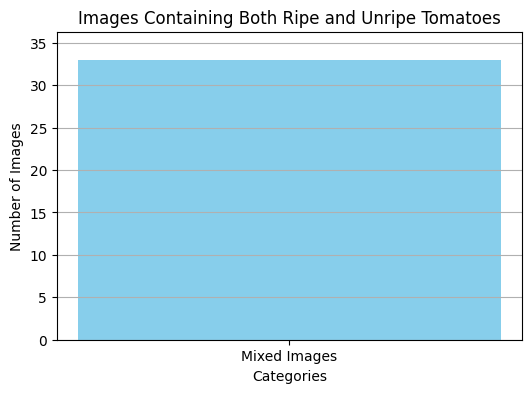

In [ ]:
# Plotting mixed images count
plot_mixed_images_count(mixed_images_count)

#O conjunto de dados contém imagens que possuem tanto tomates maduros quanto verdes, então vamos criar uma função para encontrar e exibir imagens de amostra que tenham ambos.

In [ ]:
def show_sample_mixed_images(images_dir, labels_dir, num_samples=3):
    # Load dataset
    images, annotations = load_data(images_dir, labels_dir)

    # Initialize a list to store paths of mixed images
    mixed_image_paths = []

    # Iterate through annotations to find images with both classes
    for i, annotation_file in enumerate(annotations):
        with open(annotation_file, 'r') as f:
            lines = f.readlines()
            has_ripe = False
            has_unripe = False
            for line in lines:
                class_label = int(line.split()[0])  # assuming YOLO format with class label as first entry
                if class_label == 0:
                    has_unripe = True
                elif class_label == 1:
                    has_ripe = True
            if has_ripe and has_unripe:
                mixed_image_paths.append(images[i])

        # Stop when enough samples are found
        if len(mixed_image_paths) >= num_samples:
            break

    # Display sample images
    if mixed_image_paths:
        plt.figure(figsize=(15, 6))
        for i, image_path in enumerate(random.sample(mixed_image_paths, num_samples)):
            image = Image.open(image_path)
            plt.subplot(1, num_samples, i + 1)
            plt.imshow(image)
            plt.axis('off')
            plt.title(f'Sample {i+1}')
        plt.tight_layout()
        plt.show()
    else:
        print("No images found with both ripe and unripe tomatoes.")

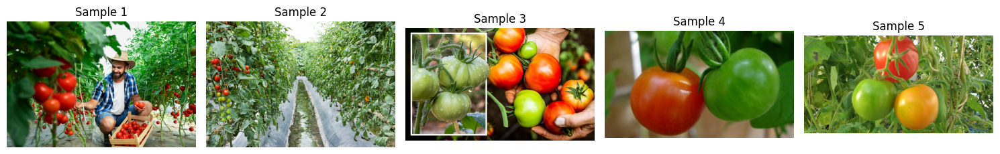

In [ ]:
show_sample_mixed_images(images_dir, labels_dir, num_samples=5)

#Para desenhar as caixas delimitadoras em uma imagem com base nas anotações, utilizaremos a função draw_bounding_boxes.

In [ ]:
def draw_bounding_boxes(image_path, annotation_path):
    image = Image.open(image_path)
    draw = ImageDraw.Draw(image)
    with open(annotation_path, 'r') as f:
        for line in f:
            class_label, x_center, y_center, width, height = map(float, line.strip().split())
            # Convert YOLO format to bounding box coordinates
            img_width, img_height = image.size
            x_center *= img_width
            y_center *= img_height
            width *= img_width
            height *= img_height
            x_min = x_center - (width / 2)
            x_max = x_center + (width / 2)
            y_min = y_center - (height / 2)
            y_max = y_center + (height / 2)
            # Draw rectangle
            if class_label == 0:
                color = 'green'  # unripe
            else:
                color = 'red'  # ripe
            draw.rectangle([x_min, y_min, x_max, y_max], outline=color, width=2)
    return image

#Como é possível ter tanto tomates maduros quanto verdes em uma única imagem, vamos criar uma função para exibir essas imagens com caixas delimitadoras.

In [ ]:
def show_sample_mixed_images_with_bounding_boxes(images_dir, labels_dir, num_samples=3):
    # Load dataset
    images, annotations = load_data(images_dir, labels_dir)

    # Initialize a list to store paths of mixed images
    mixed_image_paths = []

    # Iterate through annotations to find images with both classes
    for i, annotation_file in enumerate(annotations):
        with open(annotation_file, 'r') as f:
            lines = f.readlines()
            has_ripe = False
            has_unripe = False
            for line in lines:
                class_label = int(line.split()[0])  # assuming YOLO format with class label as first entry
                if class_label == 0:
                    has_unripe = True
                elif class_label == 1:
                    has_ripe = True
            if has_ripe and has_unripe:
                mixed_image_paths.append((images[i], annotations[i]))

        # Stop when enough samples are found
        if len(mixed_image_paths) >= num_samples:
            break

    # Display sample images
    if mixed_image_paths:
        plt.figure(figsize=(15, 6))
        for i, (image_path, annotation_path) in enumerate(random.sample(mixed_image_paths, num_samples)):
            original_image = Image.open(image_path)
            annotated_image = draw_bounding_boxes(image_path, annotation_path)

            plt.subplot(2, num_samples, i + 1)
            plt.imshow(original_image)
            plt.axis('off')
            plt.title(f'Original {i+1}')

            plt.subplot(2, num_samples, num_samples + i + 1)
            plt.imshow(annotated_image)
            plt.axis('off')
            plt.title(f'Annotated {i+1}')

        plt.tight_layout()
        plt.show()
    else:
        print("No images found with both ripe and unripe tomatoes.")

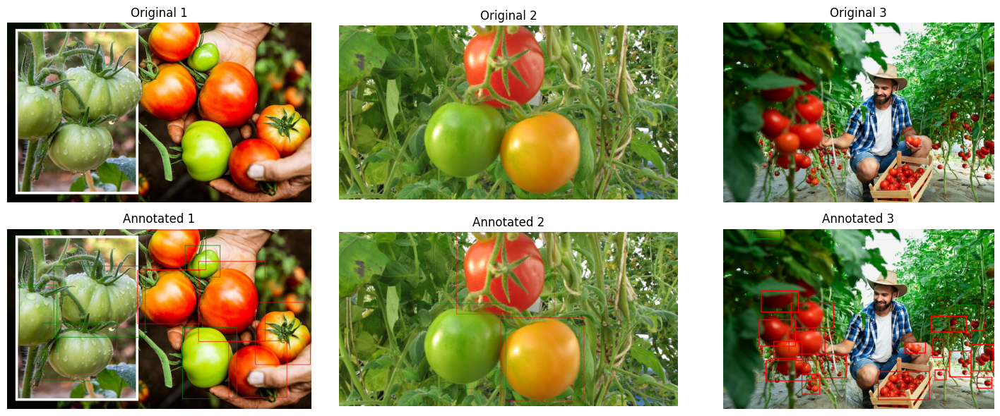

In [ ]:
show_sample_mixed_images_with_bounding_boxes(images_dir, labels_dir, num_samples=3)

In [ ]:
# Handle potential train/test subdirectories
working_dir = os.path.join("working")
train_images_dir = os.path.join(working_dir, "train", "images")
train_labels_dir = os.path.join(working_dir, "train", 'labels')
test_images_dir = os.path.join(working_dir,"test", 'images')
test_labels_dir = os.path.join(working_dir, "test", 'labels')

print(f"Train Images Dir: {train_images_dir}, Train Labels Dir: {train_labels_dir}")
print(f"Test Images Dir: {test_images_dir}, Test Labels Dir: {test_labels_dir}")

Train Images Dir: working/train/images, Train Labels Dir: working/train/labels
Test Images Dir: working/test/images, Test Labels Dir: working/test/labels


In [ ]:
# Create train/test directories if they don't exist (using os.makedirs with exist_ok=True)
os.makedirs(train_images_dir, exist_ok=True)
os.makedirs(train_labels_dir, exist_ok=True)
os.makedirs(test_images_dir, exist_ok=True)
os.makedirs(test_labels_dir, exist_ok=True)

#Agora que criamos as pastas correspondentes, vamos começar a importar as imagens.

In [ ]:
# Get list of images and labels
images = [f for f in os.listdir(images_dir) if f.endswith('.jpeg')]
labels = [f.replace('.jpeg', '.txt') for f in images]

#Vamos visualizar a quantidade de imagens e rótulos que temos.

In [ ]:
print(f"Images Length: {len(images)}")
print(f"Labels Length: {len(labels)}")

Images Length: 177
Labels Length: 177


#Temos um número igual de imagens e rótulos. Agora, vamos dividir o conjunto de dados, onde o conjunto de treinamento conterá 80% das imagens e os 20% restantes ficarão no conjunto de teste.

In [ ]:
# Split into training and testing sets
train_images, test_images = train_test_split(images, test_size=0.2, random_state=42)
train_labels = [f.replace('.jpeg', '.txt') for f in train_images]
test_labels = [f.replace('.jpeg', '.txt') for f in test_images]
print(f"Training set: {len(train_images)} images, {len(train_labels)} labels")
print(f"Testing set: {len(test_images)} images, {len(test_labels)} labels")

Training set: 141 images, 141 labels
Testing set: 36 images, 36 labels


#Após dividir o conjunto de dados, vamos mover os arquivos para suas respectivas pastas.

In [ ]:
# Copy files to the respective directories
def copy_files(file_list, src_path, dst_path):
    for file in file_list:
        shutil.copy(os.path.join(src_path, file), os.path.join(dst_path, file))

In [ ]:
copy_files(train_images, images_dir, train_images_dir)
copy_files(train_labels, labels_dir, train_labels_dir)
copy_files(test_images, images_dir, test_images_dir)
copy_files(test_labels, labels_dir, test_labels_dir)

In [ ]:
def calculate_iou(box1, box2):
    x1, y1, w1, h1 = box1
    x2, y2, w2, h2 = box2

    xi1 = max(x1, x2)
    yi1 = max(y1, y2)
    xi2 = min(x1 + w1, x2 + w2)
    yi2 = min(y1 + h1, y2 + h2)

    inter_area = max(0, xi2 - xi1) * max(0, yi2 - yi1)
    box1_area = w1 * h1
    box2_area = w2 * h2

    union_area = box1_area + box2_area - inter_area

    return inter_area / union_area

In [ ]:
def calculate_iou(box1, box2):
    xi1 = max(box1[0], box2[0])
    yi1 = max(box1[1], box2[1])
    xi2 = min(box1[2], box2[2])
    yi2 = min(box1[3], box2[3])

    inter_area = max(0, xi2 - xi1) * max(0, yi2 - yi1)
    box1_area = (box1[2] - box1[0]) * (box1[3] - box1[1])
    box2_area = (box2[2] - box2[0]) * (box2[3] - box2[1])

    union_area = box1_area + box2_area - inter_area
    return inter_area / union_area if union_area != 0 else 0

def convert_yolo_to_bbox(yolo_bbox, img_width, img_height):
    x_center, y_center, width, height = yolo_bbox
    x_min = (x_center - width / 2) * img_width
    x_max = (x_center + width / 2) * img_width
    y_min = (y_center - height / 2) * img_height
    y_max = (y_center + height / 2) * img_height
    return [x_min, y_min, x_max, y_max]


ious = []

for annotation_file in annotations:
    with open(annotation_file, 'r') as file:
        lines = file.readlines()
        boxes = []
        for line in lines:
            _, x_center, y_center, width, height = map(float, line.split())
            bbox = convert_yolo_to_bbox([x_center, y_center, width, height], img_width=average_width, img_height=average_height)
            boxes.append(bbox)
        # Calculate IoU for every pair of boxes in the same image
        for i in range(len(boxes)):
            for j in range(i + 1, len(boxes)):
                iou = calculate_iou(boxes[i], boxes[j])
                ious.append(iou)

average_iou = np.mean(ious)
print("Average IoU:", average_iou)

Average IoU: 0.02112734849353217


#Criação do Modelo
Para o nosso projeto de detecção de tomates maduros e verdes, vamos instalar o YOLO e verificar seu funcionamento.

In [ ]:
# setup
%pip install ultralytics
import ultralytics
ultralytics.checks()

Ultralytics 8.3.134 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
Setup complete ✅ (2 CPUs, 12.7 GB RAM, 41.9/112.6 GB disk)


#Em seguida, vamos criar um arquivo de configuração para o YOLO. Esse arquivo fornece informações sobre o conjunto de dados e as classes que ele contém.

In [ ]:
dataset_yaml = """
train: working/train/images
val: working/test/images

nc: 2  # number of classes
names: ['unripe', 'ripe']  # class names
"""

with open('working/dataset.yaml', 'w') as file:
    file.write(dataset_yaml)

In [ ]:
!yolo #checar os comandos disponiveis no yolo


    Arguments received: ['yolo']. Ultralytics 'yolo' commands use the following syntax:

        yolo TASK MODE ARGS

        Where   TASK (optional) is one of frozenset({'detect', 'segment', 'classify', 'obb', 'pose'})
                MODE (required) is one of frozenset({'predict', 'benchmark', 'train', 'track', 'val', 'export'})
                ARGS (optional) are any number of custom 'arg=value' pairs like 'imgsz=320' that override defaults.
                    See all ARGS at https://docs.ultralytics.com/usage/cfg or with 'yolo cfg'

    1. Train a detection model for 10 epochs with an initial learning_rate of 0.01
        yolo train data=coco8.yaml model=yolo11n.pt epochs=10 lr0=0.01

    2. Predict a YouTube video using a pretrained segmentation model at image size 320:
        yolo predict model=yolo11n-seg.pt source='https://youtu.be/LNwODJXcvt4' imgsz=320

    3. Val a pretrained detection model at batch-size 1 and image size 640:
        yolo val model=yolo11n.pt data=coco8.

#Treinamento do Modelo
Vamos treinar nosso modelo usando 130 épocas, com um tamanho de lote (batch size) de 16, e definiremos o tamanho da imagem para 640. A análise exploratória de dados (EDA) mostra mais informações sobre as imagens e seus tamanhos.

batches por epoca = 177/16 = 11,06 - ou seja, 12 batches por lote

total de passos = 130 epocas x 12 batches por epoca = 1560 passos

Resumo final:
Total de imagens: 177

Batch size: 16

Épocas: 130

Batches por época: 12

Total de passos: 1.560

In [ ]:
from ultralytics import YOLO
from IPython.display import Image, display

# Load the trained YOLO model
model = YOLO('yolov8n.pt')
data_yaml_path = "working/dataset.yaml"

results = model.train(data = data_yaml_path,
            epochs=130,
            imgsz=720,
            device=0,
            lr0=0.01,  # initial learning rate
            lrf=0.001,  # final learning rate
            save_period=10
           )

Ultralytics 8.3.134 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=working/dataset.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=130, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=720, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.001, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8n.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=train5, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=100, perspective=0.0, plots=True, pose=12.0, pretrained=True, p

100%|██████████| 755k/755k [00:00<00:00, 21.8MB/s]

Overriding model.yaml nc=80 with nc=2

                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      7360  ultralytics.nn.modules.block.C2f             [32, 32, 1, True]             
  3                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  4                  -1  2     49664  ultralytics.nn.modules.block.C2f             [64, 64, 2, True]             
  5                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  6                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  7                  -1  1    295424  ultralytics

Model summary: 129 layers, 3,011,238 parameters, 3,011,222 gradients, 8.2 GFLOPs

Transferred 319/355 items from pretrained weights
Freezing layer 'model.22.dfl.conv.weight'
AMP: running Automatic Mixed Precision (AMP) checks...


100%|██████████| 5.35M/5.35M [00:00<00:00, 94.2MB/s]


AMP: checks passed ✅
WARNING ⚠️ imgsz=[720] must be multiple of max stride 32, updating to [736]
train: Fast image access ✅ (ping: 0.0±0.0 ms, read: 106.6±116.0 MB/s, size: 180.5 KB)


train: Scanning /content/working/train/labels... 141 images, 0 backgrounds, 0 corrupt: 100%|██████████| 141/141 [00:00<00:00, 462.15it/s]

train: New cache created: /content/working/train/labels.cache


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 24.2±20.6 MB/s, size: 183.0 KB)


val: Scanning /content/working/test/labels... 36 images, 0 backgrounds, 0 corrupt: 100%|██████████| 36/36 [00:00<00:00, 370.38it/s]

val: New cache created: /content/working/test/labels.cache


Plotting labels to runs/detect/train5/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001667, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
Image sizes 736 train, 736 val
Using 2 dataloader workers
Logging results to runs/detect/train5
Starting training for 130 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      1/130      2.81G      1.418       2.97      1.635        109        736: 100%|██████████| 9/9 [00:07<00:00,  1.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.02it/s]

                   all         36        158     0.0133      0.917      0.423      0.272



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      2/130      3.29G       1.41      2.215      1.549         98        736: 100%|██████████| 9/9 [00:02<00:00,  3.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.47it/s]

                   all         36        158      0.548      0.309        0.5      0.301



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      3/130      3.31G      1.454      1.753      1.525        140        736: 100%|██████████| 9/9 [00:04<00:00,  2.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.38it/s]

                   all         36        158      0.849       0.33      0.542      0.335



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      4/130      3.32G      1.388      1.555       1.49        108        736: 100%|██████████| 9/9 [00:02<00:00,  3.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.28it/s]

                   all         36        158      0.706        0.6      0.717      0.464



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      5/130      3.35G      1.319       1.33      1.432        126        736: 100%|██████████| 9/9 [00:02<00:00,  3.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.37it/s]

                   all         36        158      0.826      0.753      0.785      0.508



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      6/130      3.36G      1.325      1.257      1.443        125        736: 100%|██████████| 9/9 [00:02<00:00,  3.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.01it/s]


                   all         36        158      0.814      0.652      0.705      0.464

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      7/130      3.38G        1.3        1.2      1.407        132        736: 100%|██████████| 9/9 [00:02<00:00,  3.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.95it/s]

                   all         36        158      0.803      0.674      0.804      0.524



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      8/130       3.4G      1.336      1.217      1.407        120        736: 100%|██████████| 9/9 [00:02<00:00,  3.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.01it/s]

                   all         36        158      0.871      0.815      0.854      0.577



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/130      3.41G      1.252      1.227      1.377        134        736: 100%|██████████| 9/9 [00:02<00:00,  3.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.88it/s]

                   all         36        158      0.711      0.577      0.691      0.434



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/130      3.43G      1.313      1.203        1.4        145        736: 100%|██████████| 9/9 [00:03<00:00,  2.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.68it/s]

                   all         36        158      0.847      0.749       0.88      0.562



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     11/130      3.45G      1.258      1.114      1.375        134        736: 100%|██████████| 9/9 [00:02<00:00,  4.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.66it/s]

                   all         36        158      0.796      0.683      0.844      0.543



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     12/130      3.46G      1.295      1.087      1.358        142        736: 100%|██████████| 9/9 [00:02<00:00,  3.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.88it/s]

                   all         36        158      0.646      0.722      0.726      0.444



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     13/130      3.47G      1.273      1.041      1.375        104        736: 100%|██████████| 9/9 [00:03<00:00,  2.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.34it/s]

                   all         36        158      0.925      0.795      0.922      0.574



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     14/130       3.5G      1.278      1.062      1.361        114        736: 100%|██████████| 9/9 [00:02<00:00,  3.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.14it/s]

                   all         36        158      0.911      0.766      0.892      0.551



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     15/130      3.52G      1.257      1.063      1.349        132        736: 100%|██████████| 9/9 [00:02<00:00,  3.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.32it/s]

                   all         36        158      0.834      0.837      0.887      0.535



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     16/130      3.54G      1.238      1.036      1.352        108        736: 100%|██████████| 9/9 [00:03<00:00,  2.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.16it/s]


                   all         36        158      0.868      0.867      0.918       0.55

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     17/130      3.54G       1.22     0.9921      1.327        111        736: 100%|██████████| 9/9 [00:02<00:00,  4.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.55it/s]

                   all         36        158      0.903      0.673      0.774      0.482



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     18/130      3.57G      1.252     0.9685      1.332        140        736: 100%|██████████| 9/9 [00:02<00:00,  4.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.17it/s]

                   all         36        158      0.935      0.697      0.803      0.537



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     19/130      3.58G      1.149      0.925      1.301        107        736: 100%|██████████| 9/9 [00:02<00:00,  3.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.90it/s]

                   all         36        158      0.691      0.803       0.79      0.483



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     20/130       3.6G      1.222     0.9626      1.319        129        736: 100%|██████████| 9/9 [00:02<00:00,  3.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.75it/s]

                   all         36        158      0.925      0.878      0.933       0.59



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     21/130      3.61G      1.204     0.9169      1.333        142        736: 100%|██████████| 9/9 [00:02<00:00,  3.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.25it/s]

                   all         36        158       0.89      0.818      0.928      0.575



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     22/130      3.63G      1.199     0.9278      1.334        148        736: 100%|██████████| 9/9 [00:02<00:00,  3.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.58it/s]


                   all         36        158      0.902      0.829      0.906      0.582

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     23/130      3.65G      1.141     0.9162      1.287        159        736: 100%|██████████| 9/9 [00:02<00:00,  3.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.58it/s]

                   all         36        158      0.916      0.887      0.938       0.61



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     24/130      3.67G      1.187     0.9169      1.302        102        736: 100%|██████████| 9/9 [00:02<00:00,  3.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.46it/s]

                   all         36        158       0.87      0.892      0.913      0.552



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     25/130      3.68G       1.18     0.8798       1.31        110        736: 100%|██████████| 9/9 [00:02<00:00,  4.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.14it/s]

                   all         36        158      0.909      0.896      0.935       0.57



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     26/130      3.71G      1.125      0.826      1.276        159        736: 100%|██████████| 9/9 [00:03<00:00,  2.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.49it/s]

                   all         36        158      0.951      0.878      0.941      0.629



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     27/130      3.72G        1.1     0.8263      1.259        181        736: 100%|██████████| 9/9 [00:02<00:00,  3.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.26it/s]

                   all         36        158       0.91      0.837      0.938      0.633



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     28/130      3.74G      1.138     0.8821      1.286        103        736: 100%|██████████| 9/9 [00:02<00:00,  3.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.17it/s]

                   all         36        158      0.833      0.783      0.873       0.58



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     29/130      3.75G      1.145     0.8538      1.278        113        736: 100%|██████████| 9/9 [00:02<00:00,  3.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.92it/s]

                   all         36        158      0.876      0.809      0.878      0.583



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     30/130      3.77G      1.103     0.8137      1.272        110        736: 100%|██████████| 9/9 [00:02<00:00,  3.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.11it/s]

                   all         36        158      0.901      0.783      0.885      0.589



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     31/130      3.79G      1.116     0.8112      1.262        122        736: 100%|██████████| 9/9 [00:02<00:00,  3.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.91it/s]

                   all         36        158      0.868      0.842      0.887      0.596



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     32/130      3.81G      1.134     0.8042      1.276        154        736: 100%|██████████| 9/9 [00:03<00:00,  2.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.44it/s]

                   all         36        158      0.919      0.852      0.893      0.586



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     33/130      3.81G      1.117     0.7721      1.264        153        736: 100%|██████████| 9/9 [00:02<00:00,  4.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.46it/s]


                   all         36        158      0.914      0.882      0.928        0.6

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     34/130      3.84G      1.164     0.7879      1.272        128        736: 100%|██████████| 9/9 [00:02<00:00,  3.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.55it/s]

                   all         36        158      0.833      0.888       0.92      0.598



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     35/130      3.86G      1.112     0.7918      1.284        108        736: 100%|██████████| 9/9 [00:02<00:00,  3.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.12it/s]

                   all         36        158      0.902      0.904      0.947      0.617



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     36/130      3.88G      1.115      0.801      1.285        129        736: 100%|██████████| 9/9 [00:02<00:00,  3.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.19it/s]

                   all         36        158      0.974      0.863      0.953      0.639



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     37/130      3.88G      1.082     0.7778      1.232        136        736: 100%|██████████| 9/9 [00:02<00:00,  3.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.01it/s]

                   all         36        158      0.953      0.903      0.963      0.622



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     38/130      3.91G      1.058      0.732      1.223        173        736: 100%|██████████| 9/9 [00:02<00:00,  4.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.08it/s]

                   all         36        158      0.973       0.91      0.969      0.645



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     39/130      3.93G      1.067     0.7379      1.231        116        736: 100%|██████████| 9/9 [00:03<00:00,  2.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.90it/s]

                   all         36        158       0.96      0.918      0.967      0.636



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     40/130      3.94G      1.085     0.7121      1.239        148        736: 100%|██████████| 9/9 [00:02<00:00,  3.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.21it/s]

                   all         36        158      0.931      0.878      0.929      0.623



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     41/130      3.95G      1.042     0.6977       1.22        132        736: 100%|██████████| 9/9 [00:02<00:00,  3.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.59it/s]

                   all         36        158      0.926      0.855      0.923      0.613



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     42/130      3.98G      1.094     0.7385      1.272        135        736: 100%|██████████| 9/9 [00:03<00:00,  2.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.51it/s]

                   all         36        158      0.939      0.842      0.903      0.617



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     43/130         4G      1.091     0.7516      1.252        107        736: 100%|██████████| 9/9 [00:03<00:00,  2.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.89it/s]

                   all         36        158      0.953        0.9      0.928      0.632



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     44/130      4.01G      1.033     0.6833      1.238        141        736: 100%|██████████| 9/9 [00:02<00:00,  3.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.10it/s]

                   all         36        158      0.903      0.904      0.953      0.644



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     45/130      4.02G      1.058     0.7158      1.239        112        736: 100%|██████████| 9/9 [00:04<00:00,  1.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.00it/s]

                   all         36        158      0.932      0.905      0.939      0.634



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     46/130      4.05G       1.05     0.6856      1.212        139        736: 100%|██████████| 9/9 [00:02<00:00,  3.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.04it/s]

                   all         36        158      0.919      0.932      0.957      0.643



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     47/130      4.06G      1.061     0.6917      1.213        132        736: 100%|██████████| 9/9 [00:02<00:00,  3.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.28it/s]

                   all         36        158      0.931      0.931       0.97       0.65



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     48/130      4.08G      1.092       0.71      1.237        128        736: 100%|██████████| 9/9 [00:03<00:00,  2.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.24it/s]

                   all         36        158      0.948      0.921      0.969      0.661



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     49/130      4.09G       1.05      0.723      1.223        104        736: 100%|██████████| 9/9 [00:02<00:00,  3.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.22it/s]

                   all         36        158      0.883      0.941      0.964       0.65



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     50/130      4.11G      1.077     0.6959      1.223        173        736: 100%|██████████| 9/9 [00:02<00:00,  3.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.24it/s]


                   all         36        158      0.929      0.905      0.965       0.65

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     51/130      4.13G       1.03     0.6924      1.214        153        736: 100%|██████████| 9/9 [00:02<00:00,  4.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.39it/s]

                   all         36        158      0.957      0.909      0.969      0.641



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     52/130      4.15G     0.9898     0.6734      1.191        103        736: 100%|██████████| 9/9 [00:02<00:00,  3.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.50it/s]

                   all         36        158      0.899      0.828      0.937      0.617



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     53/130      4.16G     0.9922     0.6448      1.191        108        736: 100%|██████████| 9/9 [00:02<00:00,  3.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.23it/s]

                   all         36        158      0.934      0.885      0.961      0.626



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     54/130      4.18G       1.02     0.6471      1.193        178        736: 100%|██████████| 9/9 [00:02<00:00,  3.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.37it/s]

                   all         36        158      0.945      0.894      0.955      0.622



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     55/130       4.2G      1.033     0.6734      1.223        124        736: 100%|██████████| 9/9 [00:02<00:00,  3.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.27it/s]

                   all         36        158      0.936      0.922      0.955      0.629



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     56/130      4.22G       1.02     0.6884       1.23        146        736: 100%|██████████| 9/9 [00:02<00:00,  3.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.43it/s]

                   all         36        158      0.941      0.921      0.949      0.624



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     57/130      4.23G      1.035     0.6703      1.229        149        736: 100%|██████████| 9/9 [00:03<00:00,  2.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.79it/s]

                   all         36        158      0.954      0.911      0.944      0.627



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     58/130      4.25G       1.06       0.69      1.226        178        736: 100%|██████████| 9/9 [00:03<00:00,  2.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.12it/s]


                   all         36        158      0.924      0.898      0.943      0.622

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     59/130      4.27G      1.023     0.6496      1.228        125        736: 100%|██████████| 9/9 [00:02<00:00,  3.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.25it/s]

                   all         36        158      0.934      0.899      0.942      0.615



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     60/130      4.29G      1.017     0.6491        1.2         89        736: 100%|██████████| 9/9 [00:02<00:00,  3.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.02it/s]

                   all         36        158      0.927      0.919      0.945      0.622



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     61/130      4.29G     0.9948     0.6265      1.192        131        736: 100%|██████████| 9/9 [00:02<00:00,  3.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.98it/s]

                   all         36        158      0.926      0.935      0.933      0.629



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     62/130      4.32G      1.008     0.6573      1.209        179        736: 100%|██████████| 9/9 [00:02<00:00,  3.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.28it/s]

                   all         36        158      0.903      0.928       0.96      0.647



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     63/130      4.34G      0.994     0.6443      1.172        115        736: 100%|██████████| 9/9 [00:02<00:00,  3.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.96it/s]


                   all         36        158      0.891      0.923       0.97      0.647

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     64/130      4.35G     0.9877     0.6371      1.199        145        736: 100%|██████████| 9/9 [00:02<00:00,  3.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.17it/s]

                   all         36        158      0.912       0.91      0.969      0.641



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     65/130      4.36G     0.9803     0.6362      1.161        129        736: 100%|██████████| 9/9 [00:02<00:00,  3.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.28it/s]

                   all         36        158      0.949      0.909       0.96      0.647



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     66/130      4.39G      1.022      0.645      1.209        142        736: 100%|██████████| 9/9 [00:02<00:00,  3.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.99it/s]

                   all         36        158      0.941      0.888      0.952      0.654



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     67/130       4.4G     0.9804     0.6216      1.174        103        736: 100%|██████████| 9/9 [00:02<00:00,  3.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.45it/s]

                   all         36        158      0.953      0.875      0.955      0.656



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     68/130      4.42G     0.9662     0.6341      1.181        144        736: 100%|██████████| 9/9 [00:03<00:00,  2.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.36it/s]

                   all         36        158      0.961      0.894      0.961      0.652



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     69/130      4.43G     0.9445      0.589      1.193        141        736: 100%|██████████| 9/9 [00:02<00:00,  3.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.52it/s]


                   all         36        158      0.949      0.895       0.94      0.648

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     70/130      4.46G     0.9824     0.6256      1.168        123        736: 100%|██████████| 9/9 [00:02<00:00,  3.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.10it/s]

                   all         36        158      0.923      0.884      0.938       0.64



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     71/130      4.47G     0.9624     0.6022      1.184        125        736: 100%|██████████| 9/9 [00:02<00:00,  3.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.24it/s]

                   all         36        158      0.911       0.87      0.938      0.638



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     72/130      4.49G     0.9386      0.565      1.144        107        736: 100%|██████████| 9/9 [00:02<00:00,  3.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.18it/s]

                   all         36        158      0.931       0.87      0.932      0.643



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     73/130       4.5G     0.9781     0.5949      1.182        164        736: 100%|██████████| 9/9 [00:02<00:00,  3.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.54it/s]

                   all         36        158      0.937      0.906       0.94      0.641



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     74/130      4.52G     0.9502     0.5944      1.163        123        736: 100%|██████████| 9/9 [00:02<00:00,  3.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.20it/s]

                   all         36        158      0.928      0.888      0.942      0.637



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     75/130      4.54G     0.9425     0.5832      1.164        189        736: 100%|██████████| 9/9 [00:02<00:00,  3.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.60it/s]


                   all         36        158      0.881      0.906      0.947      0.637

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     76/130      4.56G     0.9519     0.5809      1.167        113        736: 100%|██████████| 9/9 [00:02<00:00,  3.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.99it/s]

                   all         36        158      0.921      0.879      0.954      0.642



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     77/130      4.57G     0.9348     0.5673       1.17        103        736: 100%|██████████| 9/9 [00:02<00:00,  3.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.44it/s]

                   all         36        158       0.92      0.882      0.944      0.638



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     78/130      4.59G     0.9045     0.5809      1.138        144        736: 100%|██████████| 9/9 [00:02<00:00,  3.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.67it/s]

                   all         36        158      0.919      0.884      0.933      0.632



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     79/130      4.61G     0.9215     0.5518      1.153        126        736: 100%|██████████| 9/9 [00:02<00:00,  3.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.92it/s]

                   all         36        158      0.925      0.885      0.938      0.634



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     80/130      4.63G     0.9286     0.5686      1.145        158        736: 100%|██████████| 9/9 [00:02<00:00,  3.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.60it/s]

                   all         36        158      0.907      0.904      0.937      0.636



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     81/130      4.63G      0.911     0.5538      1.134        131        736: 100%|██████████| 9/9 [00:03<00:00,  2.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.21it/s]

                   all         36        158      0.873      0.917      0.927      0.644



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     82/130      4.66G     0.9166     0.5708      1.147        134        736: 100%|██████████| 9/9 [00:02<00:00,  3.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.23it/s]

                   all         36        158      0.895      0.883      0.915      0.644



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     83/130      4.68G     0.9039     0.5491      1.119        144        736: 100%|██████████| 9/9 [00:02<00:00,  3.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.33it/s]

                   all         36        158      0.891      0.888      0.911       0.64



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     84/130       4.7G     0.9414     0.5671      1.179        110        736: 100%|██████████| 9/9 [00:02<00:00,  3.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.12it/s]

                   all         36        158      0.917      0.853      0.908      0.633



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     85/130       4.7G     0.9266     0.5635       1.13        150        736: 100%|██████████| 9/9 [00:02<00:00,  3.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.15it/s]

                   all         36        158      0.948      0.817      0.915       0.64



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     86/130      4.73G     0.9048     0.5492       1.15         84        736: 100%|██████████| 9/9 [00:02<00:00,  3.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.44it/s]

                   all         36        158      0.899      0.888      0.934       0.65



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     87/130      4.75G     0.9261     0.5508      1.137        153        736: 100%|██████████| 9/9 [00:03<00:00,  2.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.39it/s]

                   all         36        158      0.919      0.866       0.94      0.652



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     88/130      4.76G     0.9496     0.5565       1.18        133        736: 100%|██████████| 9/9 [00:02<00:00,  3.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.34it/s]

                   all         36        158      0.932       0.86      0.938      0.641



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     89/130      4.77G     0.8977      0.528      1.132        140        736: 100%|██████████| 9/9 [00:02<00:00,  3.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.29it/s]

                   all         36        158       0.94      0.856      0.937      0.644



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     90/130       4.8G     0.8983     0.5555      1.149        124        736: 100%|██████████| 9/9 [00:03<00:00,  2.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.29it/s]

                   all         36        158      0.953      0.861      0.943      0.646



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     91/130      4.81G     0.9136     0.5577      1.146        116        736: 100%|██████████| 9/9 [00:02<00:00,  3.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.27it/s]

                   all         36        158      0.906      0.914      0.943      0.647



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     92/130      4.83G     0.9084     0.5494      1.141        185        736: 100%|██████████| 9/9 [00:02<00:00,  3.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.40it/s]

                   all         36        158      0.952      0.874      0.938      0.655



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     93/130      4.84G     0.9121     0.5695      1.129        108        736: 100%|██████████| 9/9 [00:02<00:00,  4.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.44it/s]

                   all         36        158      0.936      0.897      0.953      0.654



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     94/130      4.87G     0.8829     0.5255      1.107        126        736: 100%|██████████| 9/9 [00:03<00:00,  2.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.21it/s]

                   all         36        158       0.95      0.906      0.953      0.644



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     95/130      4.88G     0.9117     0.5362      1.139        135        736: 100%|██████████| 9/9 [00:02<00:00,  3.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.41it/s]

                   all         36        158      0.936      0.901      0.958      0.646



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     96/130       4.9G     0.8692     0.5221      1.119         99        736: 100%|██████████| 9/9 [00:02<00:00,  3.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.76it/s]

                   all         36        158      0.923        0.9      0.951      0.644



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     97/130      4.91G     0.8933     0.5371      1.129        101        736: 100%|██████████| 9/9 [00:03<00:00,  2.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.11it/s]


                   all         36        158      0.922      0.903      0.948      0.644

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     98/130      4.93G     0.8818     0.5287      1.128        136        736: 100%|██████████| 9/9 [00:03<00:00,  2.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.05it/s]

                   all         36        158      0.933      0.905      0.947      0.651



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     99/130      4.95G     0.9195     0.5274      1.133        117        736: 100%|██████████| 9/9 [00:02<00:00,  4.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.19it/s]

                   all         36        158      0.932      0.889      0.941      0.648



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    100/130      4.97G      0.896     0.5155      1.123        132        736: 100%|██████████| 9/9 [00:02<00:00,  3.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.42it/s]

                   all         36        158      0.929      0.905      0.951      0.657



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    101/130      4.98G     0.8868     0.5161      1.147        135        736: 100%|██████████| 9/9 [00:02<00:00,  3.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.18it/s]

                   all         36        158      0.924      0.895      0.949      0.652



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    102/130         5G      0.877     0.5275      1.133        120        736: 100%|██████████| 9/9 [00:02<00:00,  3.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.75it/s]

                   all         36        158      0.929       0.89      0.949      0.647



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    103/130      5.02G     0.8725     0.5264       1.12        140        736: 100%|██████████| 9/9 [00:02<00:00,  3.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.13it/s]

                   all         36        158      0.946      0.892      0.945      0.651



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    104/130      5.04G       0.86     0.5034      1.122        143        736: 100%|██████████| 9/9 [00:03<00:00,  2.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.53it/s]

                   all         36        158      0.944      0.883      0.934      0.631



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    105/130      5.04G     0.8663     0.5088      1.109        123        736: 100%|██████████| 9/9 [00:02<00:00,  3.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.20it/s]

                   all         36        158      0.948      0.881      0.938      0.639



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    106/130      5.07G     0.8493     0.4895      1.115         87        736: 100%|██████████| 9/9 [00:02<00:00,  3.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.27it/s]

                   all         36        158      0.945      0.883      0.944      0.638



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    107/130      5.09G     0.8697     0.5287        1.1        151        736: 100%|██████████| 9/9 [00:03<00:00,  2.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.69it/s]

                   all         36        158      0.952      0.883      0.948      0.646



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    108/130      5.11G     0.9235     0.5215      1.149        139        736: 100%|██████████| 9/9 [00:02<00:00,  3.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.30it/s]

                   all         36        158      0.905      0.926      0.957      0.641



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    109/130      5.12G     0.8301     0.5105      1.099        179        736: 100%|██████████| 9/9 [00:02<00:00,  3.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.59it/s]

                   all         36        158      0.905      0.928      0.956      0.646



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    110/130      5.14G     0.8707     0.5088       1.11        129        736: 100%|██████████| 9/9 [00:03<00:00,  2.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.54it/s]


                   all         36        158      0.911      0.909      0.953      0.647

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    111/130      5.16G     0.8914     0.5064      1.134         93        736: 100%|██████████| 9/9 [00:02<00:00,  3.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.22it/s]

                   all         36        158      0.914      0.907      0.946      0.644



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    112/130      5.17G     0.8655     0.5278      1.116        141        736: 100%|██████████| 9/9 [00:02<00:00,  3.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.95it/s]

                   all         36        158      0.909      0.912      0.947      0.644



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    113/130      5.18G     0.8426     0.5233      1.098        105        736: 100%|██████████| 9/9 [00:02<00:00,  3.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.27it/s]

                   all         36        158      0.914      0.919      0.951      0.654



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    114/130      5.21G     0.8514     0.5064      1.101        142        736: 100%|██████████| 9/9 [00:02<00:00,  3.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.36it/s]

                   all         36        158      0.909       0.92      0.954      0.657



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    115/130      5.22G      0.823     0.5062      1.099        131        736: 100%|██████████| 9/9 [00:02<00:00,  3.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.15it/s]

                   all         36        158      0.908      0.925      0.951      0.649



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    116/130      5.24G     0.8556     0.4956      1.101        137        736: 100%|██████████| 9/9 [00:02<00:00,  3.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.25it/s]

                   all         36        158      0.923      0.921      0.956      0.647



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    117/130      5.25G     0.8309      0.486      1.087        154        736: 100%|██████████| 9/9 [00:02<00:00,  3.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.05it/s]

                   all         36        158      0.932       0.92      0.955      0.643



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    118/130      5.28G     0.8259     0.4905      1.096        134        736: 100%|██████████| 9/9 [00:02<00:00,  3.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.54it/s]

                   all         36        158      0.933      0.917      0.956      0.646



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    119/130      5.29G     0.8147     0.4652      1.108        111        736: 100%|██████████| 9/9 [00:04<00:00,  2.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.37it/s]

                   all         36        158      0.933      0.912      0.952      0.642



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    120/130      5.31G      0.837     0.4741      1.115        147        736: 100%|██████████| 9/9 [00:02<00:00,  3.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.47it/s]


                   all         36        158      0.948      0.912       0.95       0.64
Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    121/130      5.32G     0.7779     0.4754       1.08         45        736: 100%|██████████| 9/9 [00:06<00:00,  1.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.68it/s]

                   all         36        158      0.943      0.912      0.948      0.636



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    122/130      5.35G     0.8003      0.467      1.082         56        736: 100%|██████████| 9/9 [00:03<00:00,  2.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.19it/s]


                   all         36        158      0.922      0.914      0.947       0.63

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    123/130      5.36G     0.7822     0.4555      1.081         63        736: 100%|██████████| 9/9 [00:02<00:00,  3.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.46it/s]

                   all         36        158      0.955      0.894      0.947      0.628



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    124/130      5.38G     0.7918     0.4572      1.066         66        736: 100%|██████████| 9/9 [00:02<00:00,  3.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.32it/s]


                   all         36        158       0.94      0.911      0.942      0.636

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    125/130      5.39G     0.7738     0.4504      1.074         48        736: 100%|██████████| 9/9 [00:02<00:00,  3.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.25it/s]

                   all         36        158      0.941      0.918      0.943      0.636



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    126/130      5.41G     0.7968      0.445      1.076         97        736: 100%|██████████| 9/9 [00:02<00:00,  3.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.00it/s]

                   all         36        158      0.941      0.916      0.946       0.64



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    127/130      5.43G     0.7861     0.4318      1.068         59        736: 100%|██████████| 9/9 [00:02<00:00,  3.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.21it/s]

                   all         36        158      0.939      0.915      0.946      0.641



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    128/130      5.45G     0.7837     0.4605       1.07         71        736: 100%|██████████| 9/9 [00:03<00:00,  2.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.30it/s]

                   all         36        158      0.954        0.9      0.949      0.647



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    129/130      5.46G     0.7785       0.44       1.07         67        736: 100%|██████████| 9/9 [00:02<00:00,  3.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.47it/s]

                   all         36        158      0.965        0.9       0.95      0.649



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    130/130      5.48G      0.757     0.4223      1.054         65        736: 100%|██████████| 9/9 [00:02<00:00,  3.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.36it/s]

                   all         36        158      0.962        0.9      0.951      0.649



130 epochs completed in 0.148 hours.
Optimizer stripped from runs/detect/train5/weights/last.pt, 6.3MB
Optimizer stripped from runs/detect/train5/weights/best.pt, 6.3MB

Validating runs/detect/train5/weights/best.pt...
Ultralytics 8.3.134 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 72 layers, 3,006,038 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.52it/s]


                   all         36        158      0.948       0.92       0.97       0.66
                unripe         21         85      0.974      0.876       0.95      0.604
                  ripe         20         73      0.921      0.964      0.989      0.716
Speed: 0.3ms preprocess, 4.2ms inference, 0.0ms loss, 1.7ms postprocess per image
Results saved to runs/detect/train5


#Avaliação do Modelo
Vamos plotar os resultados dos testes e, em seguida, realizar a avaliação no conjunto de validação.

In [ ]:
from PIL import Image

In [ ]:
# evaluate model performance on the validation set
results = model.val()

Ultralytics 8.3.134 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 72 layers, 3,006,038 parameters, 0 gradients, 8.1 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 1028.0±747.5 MB/s, size: 90.3 KB)


val: Scanning /content/working/test/labels.cache... 36 images, 0 backgrounds, 0 corrupt: 100%|██████████| 36/36 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:03<00:00,  1.11s/it]


                   all         36        158      0.942      0.923      0.969      0.659
                unripe         21         85      0.961      0.876       0.95      0.603
                  ripe         20         73      0.922      0.969      0.989      0.714
Speed: 7.4ms preprocess, 18.8ms inference, 0.0ms loss, 4.1ms postprocess per image
Results saved to runs/detect/train52


#Teste


image 1/1 /content/working/test/images/riped_tomato_94.jpeg: 736x480 1 ripe, 61.1ms
Speed: 9.2ms preprocess, 61.1ms inference, 4.0ms postprocess per image at shape (1, 3, 736, 480)


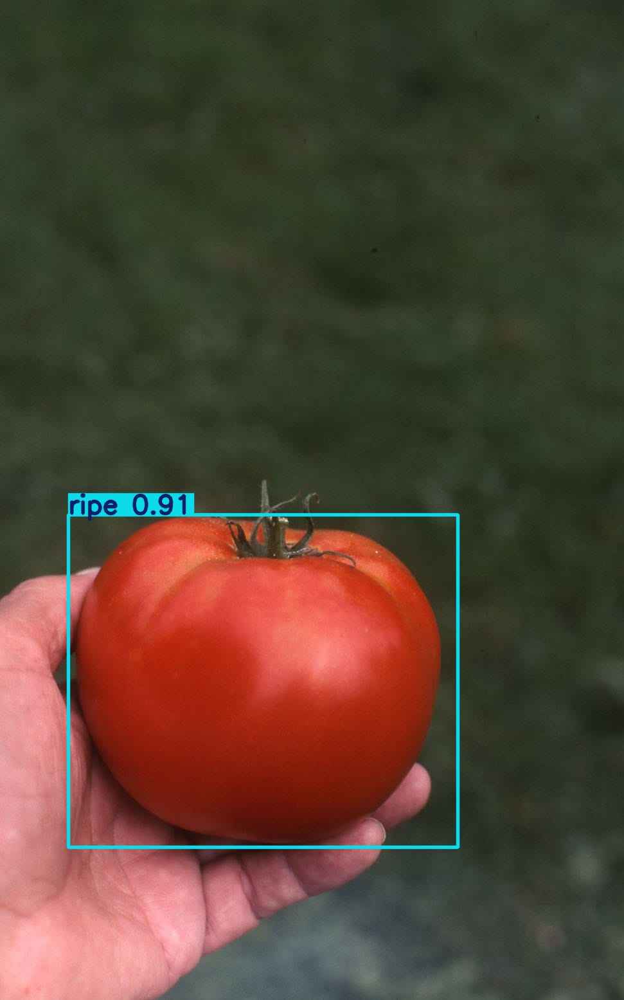


image 1/1 /content/working/test/images/unriped_tomato_28.jpeg: 480x736 3 unripes, 312.3ms
Speed: 5.4ms preprocess, 312.3ms inference, 2.1ms postprocess per image at shape (1, 3, 480, 736)


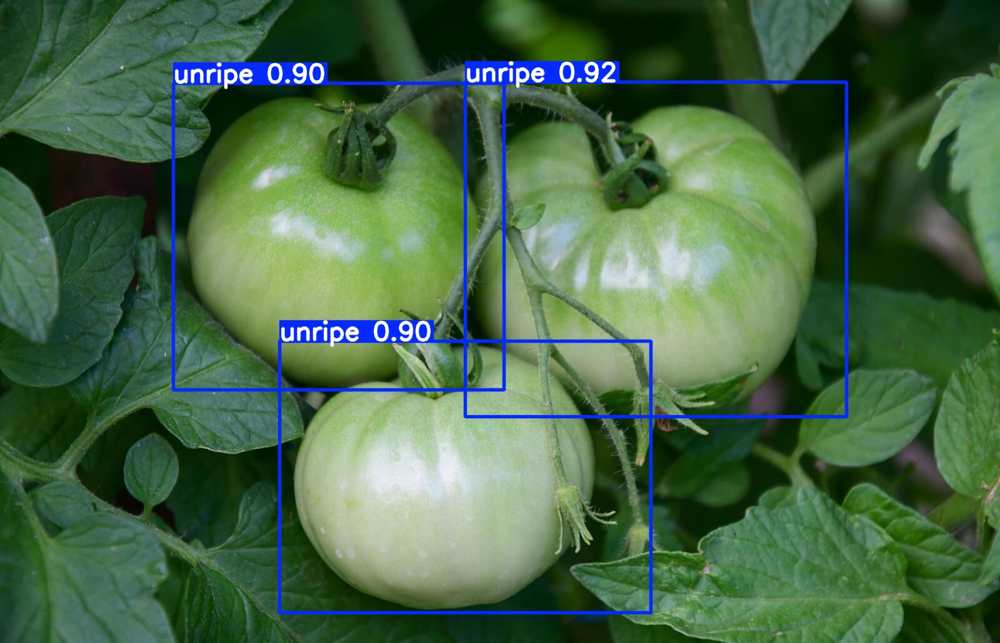


image 1/1 /content/working/test/images/riped_tomato_65.jpeg: 576x736 5 ripes, 80.9ms
Speed: 5.5ms preprocess, 80.9ms inference, 2.6ms postprocess per image at shape (1, 3, 576, 736)


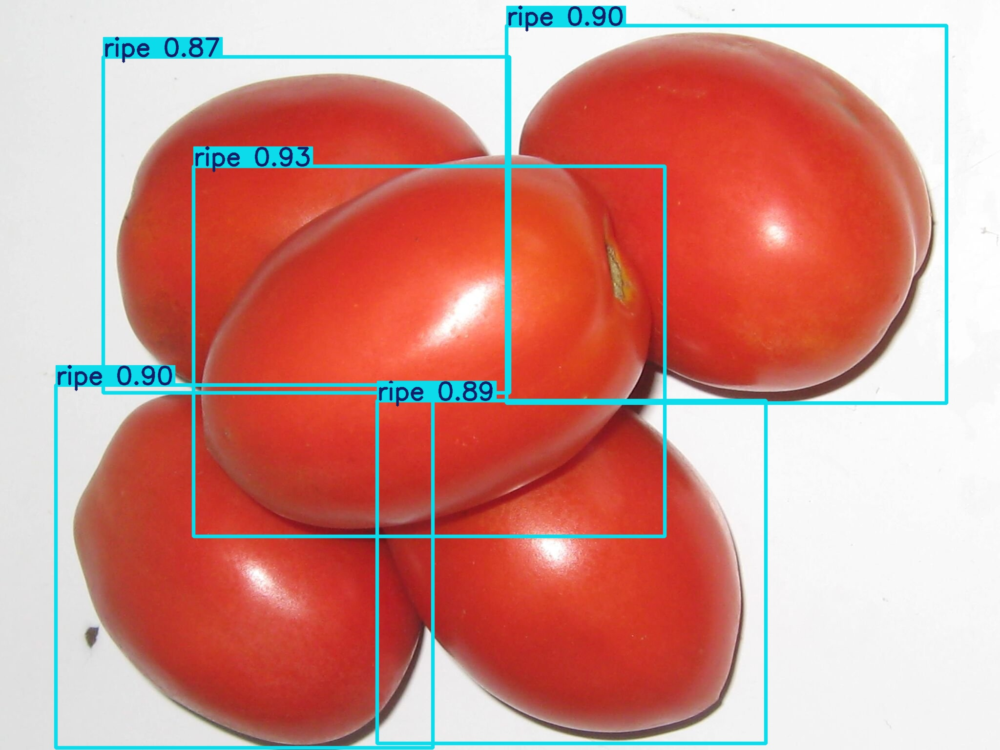


image 1/1 /content/working/test/images/unriped_tomato_62.jpeg: 512x736 4 unripes, 77.2ms
Speed: 10.9ms preprocess, 77.2ms inference, 11.4ms postprocess per image at shape (1, 3, 512, 736)


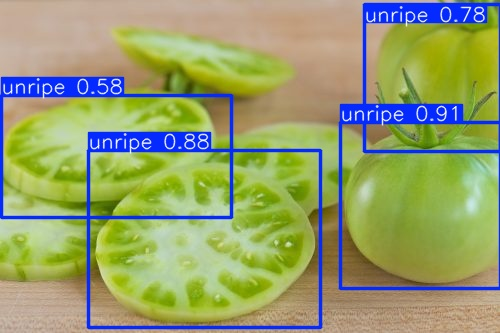


image 1/1 /content/working/test/images/unriped_tomato_68.jpeg: 416x736 1 unripe, 1 ripe, 98.4ms
Speed: 4.3ms preprocess, 98.4ms inference, 2.0ms postprocess per image at shape (1, 3, 416, 736)


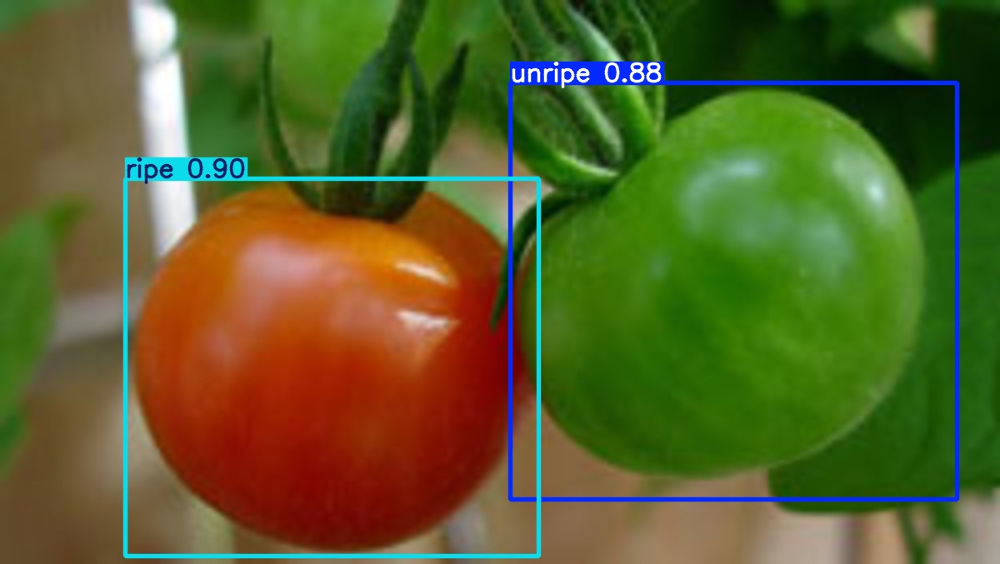

In [ ]:
# Define the path to the images
images_path = 'working/test/images'
num_images = 5

# Sample a subset of images
images = random.sample([f for f in os.listdir(images_path) if f.endswith('.jpeg')], num_images)

# Show the results on test images
for image in images:
    img_path = os.path.join(images_path, image)
    results = model(img_path, conf=0.5, iou=0.6)
    r = results[0]
    im_array = r.plot()  # plot a BGR numpy array of predictions

    # Save the image with predictions
    save_path = f'working/{image}'
    cv2.imwrite(save_path, im_array)

    # Display the image
    display(Image.open(save_path))


image 1/1 /content/working/test/images/unriped_tomato_54.jpeg: 736x608 18 unripes, 8.4ms
Speed: 3.3ms preprocess, 8.4ms inference, 1.6ms postprocess per image at shape (1, 3, 736, 608)

image 1/1 /content/working/test/images/unriped_tomato_54.jpeg: 736x608 18 unripes, 7.6ms
Speed: 3.2ms preprocess, 7.6ms inference, 1.5ms postprocess per image at shape (1, 3, 736, 608)


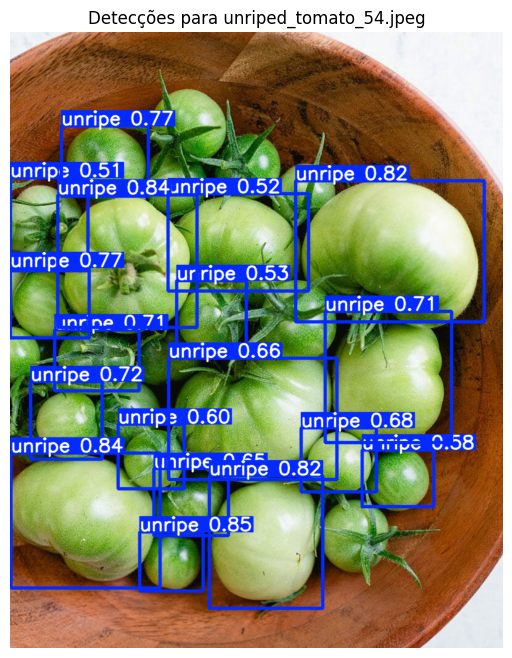

Relatório gerado com sucesso: relatorio_tomates.pdf


In [ ]:
# Instalar bibliotecas (caso ainda não tenha)
!pip install ultralytics fpdf matplotlib opencv-python

# Imports
from ultralytics import YOLO
import os
import random
import cv2
import matplotlib.pyplot as plt
from PIL import Image
from fpdf import FPDF

# 1. Carrega o modelo treinado
model = YOLO("runs/detect/train5/weights/best.pt")  # Altere o caminho se precisar

# 2. Define a pasta de imagens
image_folder = "working/test/images"  # Use aqui o MESMO que você testou
image_files = [f for f in os.listdir(image_folder) if f.endswith(('unriped_tomato_54.jpeg'))]


# 3. Contadores
ripe_count = 0
unripe_count = 0

# 4. Para exibir imagens aleatórias
num_images_to_show = 5
sample_images = random.sample(image_files, min(len(image_files), num_images_to_show))

for img_name in image_files:
    img_path = os.path.join(image_folder, img_name)
    results = model(img_path, conf=0.5, iou=0.6)
    r = results[0]

    # Conta tomates
    boxes = r.boxes
    if boxes:
        for cls in boxes.cls:
            if int(cls) == 0:
                ripe_count += 1
            elif int(cls) == 1:
                unripe_count += 1

# 5. Mostrar 5 imagens com as detecções
for img_name in sample_images:
    img_path = os.path.join(image_folder, img_name)
    results = model(img_path, conf=0.5, iou=0.6)
    r = results[0]
    im_array = r.plot()
    im_rgb = cv2.cvtColor(im_array, cv2.COLOR_BGR2RGB)
    plt.figure(figsize=(8,8))
    plt.imshow(im_rgb)
    plt.title(f'Detecções para {img_name}')
    plt.axis('off')
    plt.show()

# 6. Gera relatório
total = ripe_count + unripe_count

pdf = FPDF()
pdf.add_page()
pdf.set_font("Arial", size=14)
pdf.cell(200, 10, txt="Relatório Diário de Tomates", ln=True, align='C')
pdf.ln(10)

if total == 0:
    pdf.cell(200, 10, txt="Nenhum tomate detectado nas imagens.", ln=True, align='L')
else:
    ripe_percent = (ripe_count / total) * 100
    unripe_percent = (unripe_count / total) * 100

    pdf.cell(200, 10, txt=f"Tomates maduros (ripe): {ripe_count} ({ripe_percent:.1f}%)", ln=True)
    pdf.cell(200, 10, txt=f"Tomates verdes (unripe): {unripe_count} ({unripe_percent:.1f}%)", ln=True)

    # Cria gráfico
    labels = ['Maduros', 'Verdes']
    sizes = [ripe_count, unripe_count]
    colors = ['red', 'green']

    plt.figure(figsize=(6,6))
    plt.pie(sizes, labels=labels, autopct='%1.1f%%', colors=colors, startangle=140)
    plt.title('Proporção de Tomates')
    plt.axis('equal')
    grafico_path = "grafico_pizza.png"
    plt.savefig(grafico_path)
    plt.close()

    # Adiciona o gráfico no PDF
    pdf.image(grafico_path, x=40, y=80, w=130)

# 7. Salva o PDF
relatorio_path = "relatorio_tomates.pdf"
pdf.output(relatorio_path)

print(f"Relatório gerado com sucesso: {relatorio_path}")